## Notebook til at lave figure med data fra ourworldindata.org

In [1]:
%matplotlib inline
# Load packages and settings
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 500)
pd.set_option('display.min_rows', 50)
import seaborn as sns
import datetime


from matplotlib.patches import Patch
from matplotlib.lines import Line2D

import sys
sys.path.append("./../scripts")
import PandemiXFunctions as pf

import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (12,8)
plt.rcParams['figure.facecolor'] = (1,1,1,1)
plt.rcParams["image.cmap"] = "tab10"
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=plt.cm.tab10.colors)
fs_label = 16
parameters = {
                'axes.labelsize': fs_label,
                'axes.titlesize': fs_label+4,
                'xtick.labelsize': fs_label,
                'ytick.labelsize': fs_label, 
                'legend.fontsize': fs_label, 
                'lines.markersize': 10,
                'lines.linewidth': 3
             }
plt.rcParams.update(parameters)
from matplotlib import cm # Colormaps
import matplotlib.colors as colors
# cmap = plt.cm.get_cmap('Dark2',len(ageGroups))

import locale
import matplotlib.dates as mdates
locale.setlocale(locale.LC_TIME,"Danish")
# ax1.xaxis.set_major_formatter(mdates.DateFormatter('%b\n%Y'))
# ax1.spines['top'].set_visible(False) 

import os
# import csv
import math

from datetime import date


#saveFigures = True
saveFigures = False
print('saveFigures is set to: '+str(saveFigures))

print('Done loading packages')

saveFigures is set to: False
Done loading packages


In [2]:
# Define paths
rootdir_data = os.getcwd() +"/../Our world in data/" 
path_data = rootdir_data + "owid-covid-data.csv"

path_figs = os.getcwd() +"/../Figures/" 

#df = pd.read_csv(path_data)
df = pd.read_csv("https://raw.githubusercontent.com/owid/covid-19-data/master/public/data/owid-covid-data.csv")

In [3]:
print(df.columns)

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

In [4]:
#Set datetime for future plotting
df['date'] =  pd.to_datetime(df['date'], format='%Y-%m-%d')

In [5]:
#Choose location
def choose_location(location):
    return df.loc[df["location"] == location]

In [6]:
#Slice dates
start_pre_date = "2020-03-08" #"2021-05-01"
end_pre_date = "2021-11-24"

start_post_date = "2021-12-01"
end_post_date = "2022-03-30"

def time_slice(df, start, end):
    mask = (df['date'] > start) & (df['date'] <= end)
    return df.loc[mask]

In [7]:
#Make dictonary of sliced locations
df_pre = time_slice(df, start_pre_date, end_pre_date)
list_of_loc = df_pre.location.unique()
df_loc = {}
for loc in list_of_loc:
    df_loc[loc] = time_slice(choose_location(loc), start_pre_date, end_pre_date)
    
df_post = time_slice(df, start_post_date, end_post_date)
list_of_loc = df_post.location.unique()
df_loc_post = {}
for loc in list_of_loc:
    df_loc_post[loc] = time_slice(choose_location(loc), start_post_date, end_post_date)

### Lav dataframe for valgt data, for at rangerer lande

In [8]:
plot_data_1 = 'new_cases_smoothed_per_million'
cumulative_1 = False # True hvis data er kumulativt, False hvis det ikke er.


plot_data_2 = 'excess_mortality_cumulative_per_million'
cumulative_2 = True # True hvis data er kumulativt, False hvis det ikke er.

df_pre_sums = pd.DataFrame({
    "Location":[],
    plot_data_1:[],
    plot_data_2:[],
})
# for loc in list_of_loc:
#     sums = df_loc[loc][plot_data].sum()
#     excess_mortality = df_loc[loc]['excess_mortality'].sum()
#     loop_cases = pd.DataFrame({
#     "Location":[loc],
#     "data":[sums],
#     "Excess Mortality":[excess_mortality]    
#         })
#     df_pre_sums = pd.concat([df_pre_sums, loop_cases])

for loc in list_of_loc:
    if cumulative_1 == False:
        sums_1 = df_loc[loc][plot_data_1].sum()
    if cumulative_1 == True:
        df_loc_no_na = df_loc[loc][df_loc[loc][plot_data_1].notna()][plot_data_1]
        if len(df_loc_no_na)<2:
            sums_1 = float("nan")
        
        if len(df_loc_no_na)>2:
            sums_1 = df_loc_no_na.iloc[-1]-df_loc_no_na.iloc[0]
        
    if cumulative_2 == False:
        sums_2 = df_loc[loc][plot_data_2].sum()
    if cumulative_2 == True:
        df_loc_no_na = df_loc[loc][df_loc[loc][plot_data_2].notna()][plot_data_2]
        if len(df_loc_no_na)<2:
            sums_2 = float("nan")
        
        if len(df_loc_no_na)>2:
            sums_2 = df_loc_no_na.iloc[-1]-df_loc_no_na.iloc[0]
        
    loop_cases = pd.DataFrame({
    "Location":[loc],
    plot_data_1:[sums_1],
    plot_data_2:[sums_2]    
        })
    df_pre_sums = pd.concat([df_pre_sums, loop_cases])

    

df_post_sums = pd.DataFrame({
    "Location":[],
    plot_data_1:[],
    plot_data_2: [],
})

for loc in list_of_loc:
    if cumulative_1 == False:
        sums_1 = df_loc_post[loc][plot_data_1].sum()
    if cumulative_1 == True:
        df_loc_no_na = df_loc_post[loc][df_loc_post[loc][plot_data_1].notna()][plot_data_1]
        if len(df_loc_no_na)<2:
            sums_1 = float("nan")
        
        if len(df_loc_no_na)>2:
            sums_1 = df_loc_no_na.iloc[-1]-df_loc_no_na.iloc[0]
        
    if cumulative_2 == False:
        sums_2 = df_loc_post[loc][plot_data_2].sum()
    if cumulative_2 == True:
        df_loc_no_na = df_loc_post[loc][df_loc_post[loc][plot_data_2].notna()][plot_data_2]
        if len(df_loc_no_na)<2:
            sums_2 = float("nan")
        
        if len(df_loc_no_na)>2:
            sums_2 = df_loc_no_na.iloc[-1]-df_loc_no_na.iloc[0]
        
    loop_cases = pd.DataFrame({
    "Location":[loc],
    plot_data_1:[sums_1],
    plot_data_2:[sums_2]    
        })
    df_post_sums = pd.concat([df_post_sums, loop_cases])

# for loc in list_of_loc:
#     sums = df_loc_post[loc][plot_data].sum()
#     excess_mortality = df_loc_post[loc]['excess_mortality'].sum()
#     loop_cases = pd.DataFrame({
#     "Location":[loc],
#     "data":[sums],
#     "Excess Mortality":[excess_mortality]    
#         })
#     df_post_sums = pd.concat([df_post_sums, loop_cases])

### Plot for pre omicron

Se linje 9 for string som metode / attribute problem!

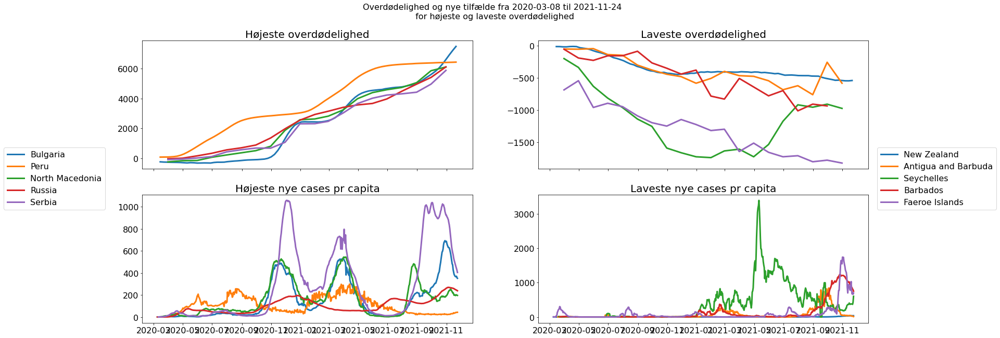

In [9]:
#Setup dataframes for plotting, sorts to find heads and tails, and cleans for nans
mortal_pre = df_pre_sums.sort_values(by=[plot_data_2],ascending=False)
cases_pre = df_pre_sums.sort_values(by=[plot_data_1],ascending=False)

df_2_no_na = df[df[plot_data_2].notna()]
df_1_no_na = df[df[plot_data_1].notna()]

#Set minimum sum of cases over period. 
cases_pre = cases_pre[cases_pre[plot_data_1] > 10000]

#Minimum number of data points
for loc in list_of_loc:
    L = len(time_slice(df_2_no_na.loc[df_2_no_na["location"] == loc], start_pre_date, end_pre_date).index)
    if L < 10:
        mortal_pre = mortal_pre[mortal_pre.Location != loc]
        cases_pre = cases_pre[cases_pre.Location != loc]

for loc in list_of_loc:
    L = len(time_slice(df_1_no_na.loc[df_1_no_na["location"] == loc], start_pre_date, end_pre_date).index)
    if L < 10:
        cases_pre = cases_pre[cases_pre.Location != loc]
        mortal_pre = mortal_pre[mortal_pre.Location != loc]
        
        
        
#Choose number of included locations
n = 5

#Choose top and bottom values
top = mortal_pre["Location"].head(n).values.tolist()
bottom = mortal_pre["Location"].tail(n).values.tolist()

# top = cases_pre["Location"].head(n).values.tolist()
# bottom = cases_pre["Location"].tail(n).values.tolist()


#Make figure
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, sharex=True, figsize=(25,10))
for loc in top:
    df_loc_loop = df_2_no_na.loc[df_2_no_na["location"] == loc]
    df_loc_loop = time_slice(df_loc_loop, start_pre_date, end_pre_date)
    ax1.plot(df_loc_loop['date'],df_loc_loop[plot_data_2], linestyle='-')
    
    df_loc_loop = df_1_no_na.loc[df_1_no_na["location"] == loc]
    df_loc_loop = time_slice(df_loc_loop, start_pre_date, end_pre_date)
    ax3.plot(df_loc_loop['date'],df_loc_loop[plot_data_1], linestyle='-')
    
    
    
for loc in bottom:
    df_loc_loop = df_2_no_na.loc[df_2_no_na["location"] == loc]
    df_loc_loop = time_slice(df_loc_loop, start_pre_date, end_pre_date)
    ax2.plot(df_loc_loop['date'],df_loc_loop[plot_data_2], linestyle='-')
    
    df_loc_loop = df_1_no_na.loc[df_1_no_na["location"] == loc]
    df_loc_loop = time_slice(df_loc_loop, start_pre_date, end_pre_date)
    ax4.plot(df_loc_loop['date'],df_loc_loop[plot_data_1], linestyle='-')

ax1.legend(top, bbox_to_anchor =(-0.1, 0.2))
ax2.legend(bottom, bbox_to_anchor =(1.4, 0.2))

ax1.title.set_text('Højeste overdødelighed')
ax2.title.set_text('Laveste overdødelighed')
ax3.title.set_text('Højeste nye cases pr capita')
ax4.title.set_text('Laveste nye cases pr capita')
fig.suptitle(f'Overdødelighed og nye tilfælde fra {start_pre_date} til {end_pre_date} \n for højeste og laveste overdødelighed', fontsize=16)
if saveFigures:
    plt.savefig(path_figs+"Top og Bund overdødelighed m cases pre omicron", bbox_inches = 'tight')

### Plot for post omicron

In [10]:
df_post_sums

,Location,new_cases_smoothed_per_million,excess_mortality_cumulative_per_million
0,Afghanistan,507.971,NaN
0,Africa,2061.076,NaN
0,Albania,25776.487,NaN
0,Algeria,1243.110,NaN
0,Andorra,296128.380,NaN
0,Angola,1000.991,NaN
0,Anguilla,86309.330,NaN
0,Antigua and Barbuda,33883.864,NaN
0,Argentina,81137.621,NaN
0,Armenia,28528.325,469.858443


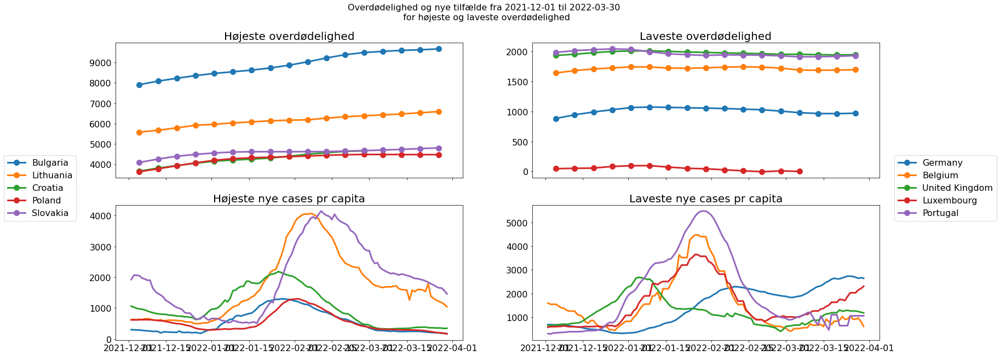

In [11]:

#Setup dataframes for plotting, sorts to find heads and tails, and cleans for nans
mortal_post = df_post_sums.sort_values(by=[plot_data_2],ascending=False)
cases_post = df_post_sums.sort_values(by=[plot_data_1],ascending=False)
df_2_no_na = df[df[plot_data_2].notna()]
df_1_no_na = df[df[plot_data_1].notna()]

#Set minimum sum of cases over period. 
cases_pre = cases_pre[cases_pre[plot_data_1] > 10000]

#Minimum number of data points
for loc in list_of_loc:
    L = len(time_slice(df_2_no_na.loc[df_2_no_na["location"] == loc], start_post_date, end_post_date).index)
    if L < 10:
        mortal_post = mortal_post[mortal_post.Location != loc]
        cases_post = cases_post[cases_post.Location != loc]

for loc in list_of_loc:
    L = len(time_slice(df_1_no_na.loc[df_1_no_na["location"] == loc], start_post_date, end_post_date).index)
    if L < 10:
        cases_post = cases_post[cases_post.Location != loc]
        mortal_post = mortal_post[mortal_post.Location != loc]
        
        
        
#Choose number of included locations
n = 5

#Choose top and bottom values
top = mortal_post["Location"].head(n).values.tolist()
bottom = mortal_post["Location"].tail(n).values.tolist()

# top = cases_pre["Location"].head(n).values.tolist()
# bottom = cases_pre["Location"].tail(n).values.tolist()


#Make figure
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, sharex=True, figsize=(25,10))
for loc in top:
    df_loc_loop = df_2_no_na.loc[df_2_no_na["location"] == loc]
    df_loc_loop = time_slice(df_loc_loop, start_post_date, end_post_date)
    ax1.plot(df_loc_loop['date'],df_loc_loop[plot_data_2], marker='o', linestyle='-')
    
    df_loc_loop = df_1_no_na.loc[df_1_no_na["location"] == loc]
    df_loc_loop = time_slice(df_loc_loop, start_post_date, end_post_date)
    ax3.plot(df_loc_loop['date'],df_loc_loop[plot_data_1], linestyle='-')
    
    
    
for loc in bottom:
    df_loc_loop = df_2_no_na.loc[df_2_no_na["location"] == loc]
    df_loc_loop = time_slice(df_loc_loop, start_post_date, end_post_date)
    ax2.plot(df_loc_loop['date'],df_loc_loop[plot_data_2], marker='o', linestyle='-')
    
    df_loc_loop = df_1_no_na.loc[df_1_no_na["location"] == loc]
    df_loc_loop = time_slice(df_loc_loop, start_post_date, end_post_date)
    ax4.plot(df_loc_loop['date'],df_loc_loop[plot_data_1], linestyle='-')

ax1.legend(top, bbox_to_anchor =(-0.1, 0.2))
ax2.legend(bottom, bbox_to_anchor =(1.35, 0.2))

ax1.title.set_text('Højeste overdødelighed')
ax2.title.set_text('Laveste overdødelighed')
ax3.title.set_text('Højeste nye cases pr capita')
ax4.title.set_text('Laveste nye cases pr capita')
fig.suptitle(f'Overdødelighed og nye tilfælde fra {start_post_date} til {end_post_date} \n for højeste og laveste overdødelighed', fontsize=16)
if saveFigures:
    plt.savefig(path_figs+"Top og Bund overdødelighed m cases post omicron", bbox_inches = 'tight')

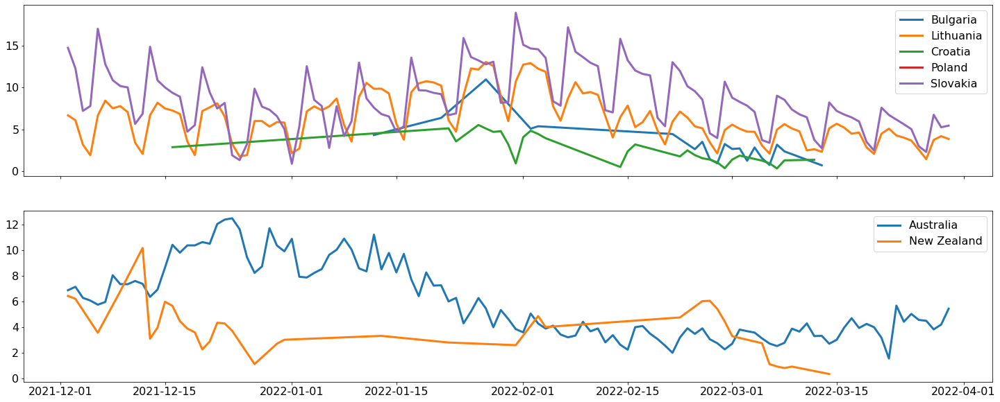

In [12]:
fig, (ax1,ax2) = plt.subplots(2, sharex=True, figsize=(25,10))
df_no_na = df[df['new_tests_per_thousand'].notna()]

for loc in top:
    df_loc_loop = df_no_na.loc[df_no_na["location"] == loc]
    df_loc_loop = time_slice(df_loc_loop, start_post_date, end_post_date)
    ax1.plot(df_loc_loop['date'],df_loc_loop['new_tests_per_thousand'], linestyle='-',label=loc)

for loc in ["Australia","New Zealand"]:
    df_loc_loop = df_no_na.loc[df_no_na["location"] == loc]
    df_loc_loop = time_slice(df_loc_loop, start_post_date, end_post_date)
    ax2.plot(df_loc_loop['date'],df_loc_loop['new_tests_per_thousand'], linestyle='-',label=loc)
    
ax1.legend(top)
ax2.legend(["Australia","New Zealand"])
if saveFigures:
    fig.suptitle(f'Nye tests per tusind, for højest og lavest overdødelighed', fontsize=24)

### Overdødelighed efter omicron, valgt fra højeste og laveste overdødelighed inden omicron

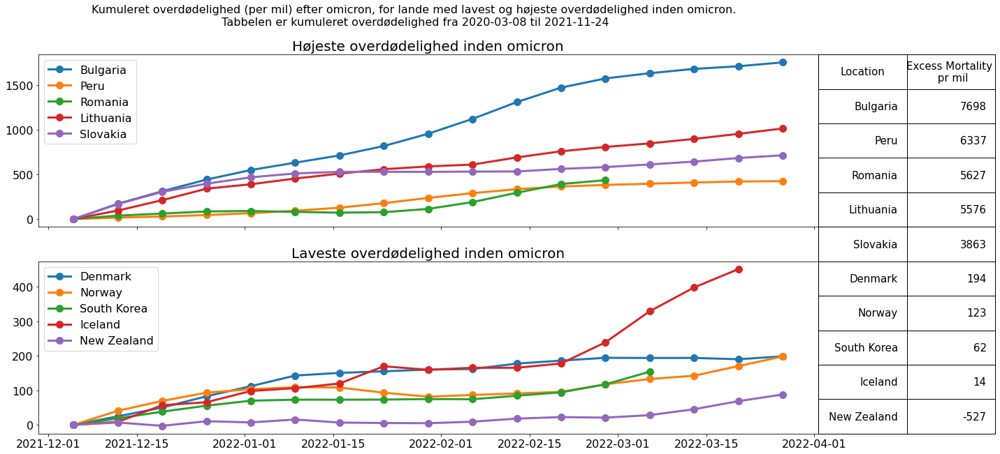

In [13]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(20,10),sharex=True)

mortal_pre_common = mortal_pre
for loc in mortal_post["Location"].tolist():
    mortal_pre_common = mortal_pre[mortal_pre.Location != loc]

#Minimum number of data points
for loc in list_of_loc:
    L = len(time_slice(df_2_no_na.loc[df_2_no_na["location"] == loc], start_post_date, end_post_date).index)
    if L < 10:
        mortal_pre_common = mortal_pre_common[mortal_pre_common.Location != loc]


top = mortal_pre_common["Location"].head(n).values.tolist()
bottom = mortal_pre_common["Location"].tail(n).values.tolist()

for loc in top:
    df_loc_loop = df_2_no_na.loc[df_2_no_na["location"] == loc]
    df_loc_loop = time_slice(df_loc_loop, start_post_date, end_post_date)
    ax1.plot(df_loc_loop['date'],df_loc_loop[plot_data_2]-df_loc_loop[plot_data_2].iloc[0], marker='o', linestyle='-')

for loc in bottom:
    df_loc_loop = df_2_no_na.loc[df_2_no_na["location"] == loc]
    df_loc_loop = time_slice(df_loc_loop, start_post_date, end_post_date)
    ax2.plot(df_loc_loop['date'],df_loc_loop[plot_data_2]-df_loc_loop[plot_data_2].iloc[0], marker='o', linestyle='-')

ax1.legend(top)
ax2.legend(bottom)

table_top = mortal_pre_common 
table_top = table_top[table_top['Location'].isin(top)]

table_bottom = mortal_pre_common 
table_bottom = table_bottom[table_bottom['Location'].isin(bottom)]

table = pd.concat([table_top, table_bottom])

table = table.drop(plot_data_1,axis=1)
table[plot_data_2] = table[plot_data_2].astype(int)

ax6 = fig.add_subplot(122)
font_size=15
bbox=[1, 0, 0.5, 1]
ax6.axis('off')
mpl_table = ax6.table(cellText = table.values,bbox=bbox, colLabels=["Location","Excess Mortality \n pr mil"])
mpl_table.auto_set_font_size(False)
mpl_table.set_fontsize(font_size)

ax1.title.set_text('Højeste overdødelighed inden omicron')
ax2.title.set_text('Laveste overdødelighed inden omicron')
fig.suptitle(f'Kumuleret overdødelighed (per mil) efter omicron, for lande med lavest og højeste overdødelighed inden omicron. \n Tabbelen er kumuleret overdødelighed fra {start_pre_date} til {end_pre_date} ', fontsize=16)



if saveFigures:
    plt.savefig(path_figs+"Overdødelighed efter omicron global top 5.jpg", bbox_inches = 'tight')

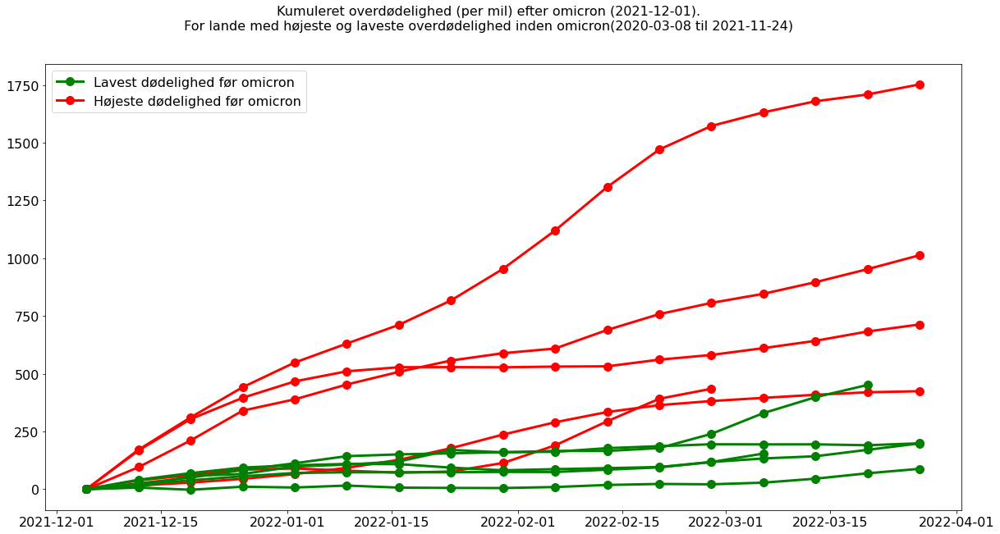

In [14]:
fig, (ax1) = plt.subplots(1, figsize=(20,10))

mortal_pre_common = mortal_pre
for loc in mortal_post["Location"].tolist():
    mortal_pre_common = mortal_pre[mortal_pre.Location != loc]

#Minimum number of data points
for loc in list_of_loc:
    L = len(time_slice(df_2_no_na.loc[df_2_no_na["location"] == loc], start_post_date, end_post_date).index)
    if L < 10:
        mortal_pre_common = mortal_pre_common[mortal_pre_common.Location != loc]


top = mortal_pre_common["Location"].head(n).values.tolist()
bottom = mortal_pre_common["Location"].tail(n).values.tolist()

for loc in top:
    df_loc_loop = df_2_no_na.loc[df_2_no_na["location"] == loc]
    df_loc_loop = time_slice(df_loc_loop, start_post_date, end_post_date)
    ax1.plot(df_loc_loop['date'],df_loc_loop[plot_data_2]-df_loc_loop[plot_data_2].iloc[0], marker='o', linestyle='-', color="r")

for loc in bottom:
    df_loc_loop = df_2_no_na.loc[df_2_no_na["location"] == loc]
    df_loc_loop = time_slice(df_loc_loop, start_post_date, end_post_date)
    ax1.plot(df_loc_loop['date'],df_loc_loop[plot_data_2]-df_loc_loop[plot_data_2].iloc[0], marker='o', linestyle='-', color="g")
    
    
legend_elements = [
                    Line2D([0], [0], marker='o', linestyle='-', color="g", label='Lavest dødelighed før omicron'),
                   Line2D([0], [0], marker='o', linestyle='-', color="r", label='Højeste dødelighed før omicron'),
                  ]

ax1.legend(handles=legend_elements, loc=2)
fig.suptitle(f'Kumuleret overdødelighed (per mil) efter omicron ({start_post_date}).\n For lande med højeste og laveste overdødelighed inden omicron({start_pre_date} til {end_pre_date}) ', fontsize=16)
if saveFigures:
    plt.savefig(path_figs+"Overdødelighed_efter_omicron_sammentlign.jpg", bbox_inches = 'tight')

### Test af Bulgariens overdødelighed
Mangler der nogen? sammentligning af summering af 'excess_mortality' og 'excess_mortality_cumulative'.

Andre excess der kan undersøges: 'excess_mortality_cumulative_absolute' og 'excess_mortality_cumulative_per_million'

Text(0.5, 0.98, 'cumulative excess mortality in Bulgaria')

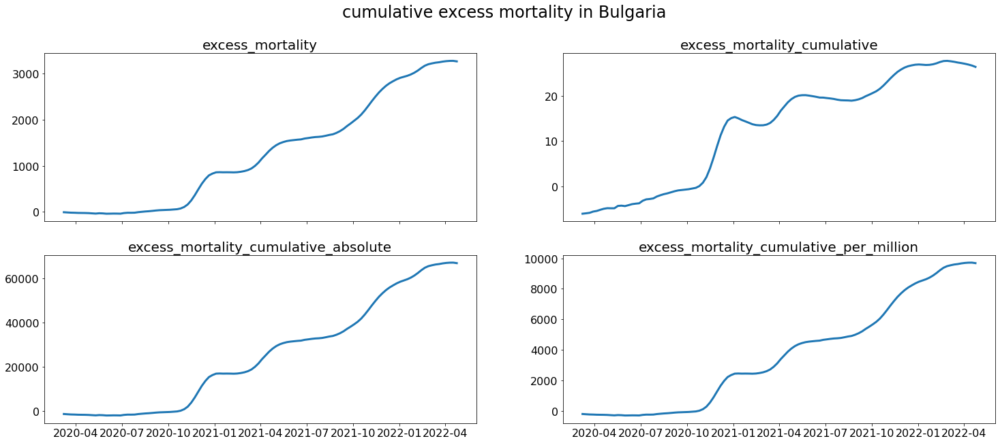

In [15]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2, sharex=True, figsize=(25,10))

loc = "Bulgaria"
###
df_BGR = choose_location(loc)
df_BGR = df_BGR[df_BGR["excess_mortality"].notna()]
df_BGR["cumsum"] = df_BGR["excess_mortality"].cumsum()

ax1.plot(df_BGR["date"],df_BGR["cumsum"])
ax1.title.set_text('excess_mortality')
###
df_BGR = choose_location(loc)
df_BGR = df_BGR[df_BGR["excess_mortality_cumulative"].notna()]

ax2.plot(df_BGR["date"],df_BGR["excess_mortality_cumulative"])
ax2.title.set_text('excess_mortality_cumulative')

###
df_BGR = choose_location(loc)
df_BGR = df_BGR[df_BGR["excess_mortality_cumulative_absolute"].notna()]

ax3.plot(df_BGR["date"],df_BGR["excess_mortality_cumulative_absolute"])
ax3.title.set_text('excess_mortality_cumulative_absolute')

###
df_BGR = choose_location(loc)
df_BGR = df_BGR[df_BGR["excess_mortality_cumulative_per_million"].notna()]

ax4.plot(df_BGR["date"],df_BGR["excess_mortality_cumulative_per_million"])
ax4.title.set_text('excess_mortality_cumulative_per_million')

fig.suptitle(f'cumulative excess mortality in {loc}', fontsize=24)

### Test slicing af kumuleret sum per mil

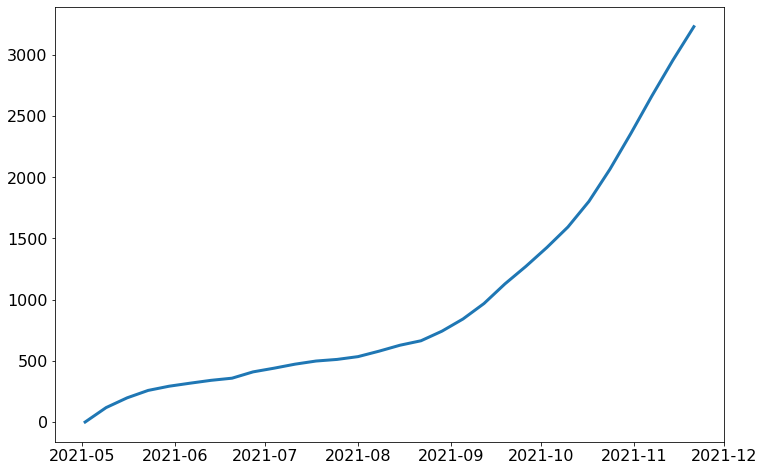

In [16]:
df_BGR = choose_location("Bulgaria")
df_BGR = df_BGR[df_BGR["excess_mortality_cumulative_per_million"].notna()]

start_pre_date = "2021-05-01"
end_pre_date = "2021-11-24"

df_BGR = time_slice(df_BGR, start_pre_date, end_pre_date)
#df_BGR.reset_index()
df_BGR["ex_mort_cum_per_mil_slice"] = df_BGR["excess_mortality_cumulative_per_million"]-df_BGR["excess_mortality_cumulative_per_million"].iloc[0]

fig, ax1 = plt.subplots(1)
ax1.plot(df_BGR["date"],df_BGR["ex_mort_cum_per_mil_slice"])

## Find Peaks

In [17]:
from scipy.signal import find_peaks


In [18]:
# plt.close('all')
# for loc in list_of_loc:
#     df_BGR = choose_location(loc)
#     data = "new_deaths_per_million"
#     df_BGR = df_BGR[df_BGR[data].notna()]

#     if len(df_BGR[data])>50:
#         plt.figure()
#         x = df_BGR['date']
#         y = df_BGR[data]
#         w = savgol_filter(y, 61, 9)

#         min_height = df_BGR[data].max()*0.1 # 10% of maximum peak size i the smallest peak we accept
#         if len(df_BGR["date"])>100:
#             min_distance = len(df_BGR["date"])/4
#         if len(df_BGR["date"])<100:
#             min_distance = 15

#         indices = find_peaks(w, distance=min_distance, height=min_height)[0]

#         i = [w[j] for j in indices]
#         xi = [df_BGR["date"].iloc[j] for j in indices]

#         plt.plot(x, w, 'b')  # high frequency noise removed
#         plt.plot(x,y,'r',alpha=0.5)
#         plt.plot(xi,i,'g*')
#         plt.title(loc)
    

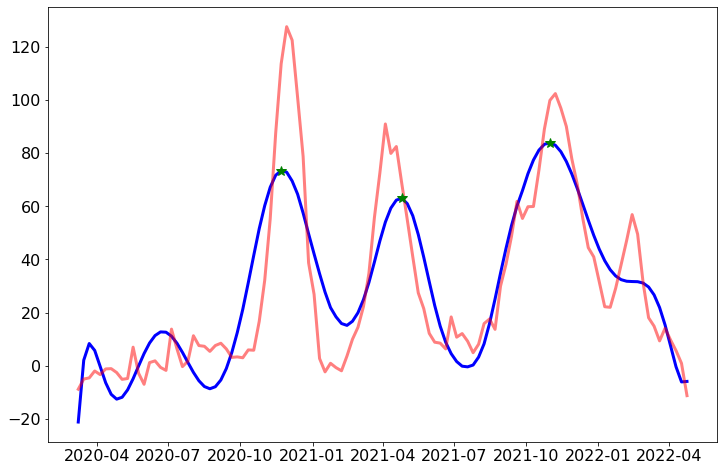

In [19]:
from scipy.signal import savgol_filter

loc = "Bulgaria"
df_BGR = choose_location(loc)
data = "excess_mortality"
df_BGR = df_BGR[df_BGR[data].notna()]

x = df_BGR['date']
y = df_BGR[data]
w = savgol_filter(y, 61, 9)

min_height = df_BGR[data].max()*0.1 # 10% of maximum peak size i the smallest peak we accept
if len(df_BGR["date"])>100:
    min_distance = len(df_BGR["date"])/6
if len(df_BGR["date"])<100:
    min_distance = 15
            
indices = find_peaks(w, distance=min_distance, height=min_height)[0]

i = [w[j] for j in indices]
xi = [df_BGR["date"].iloc[j] for j in indices]

plt.plot(x, w, 'b')  # high frequency noise removed
plt.plot(x,y,'r',alpha=0.5)
plt.plot(xi,i,'g*')


## Find interessante lande
Interessante lande er lande der ikke følger trenden at højere vaccinations rate giver lavere overdødelighed.
Et land kan være interessant på to måder. Enten har det høj vaccinations rate sammen med høj overdødelighed. Hvis vi antager vaccination altid resulterer i færre døde af covid betyder det at sådan et lands overdødelighed skyldes noget andet og skal derfor ikke regnes for et hårdt ramt land (af covid). Hvis et land har lav vaccinations rate med en lav overdødelighed, må der være noget andet der beskytter befolkningen. 

Lande er ikke interessante hvis deres overdødeligehed er høj med en lav vaccinations rate og visa versa, da det er forventeligt.

Vi kan undersøge hvilke lande der er interssante ved at finde:
$$\frac{\text{Vaccination[%]}}{\text{Overdødelighed[%]}}$$

In [20]:
df.columns

Index(['iso_code', 'continent', 'location', 'date', 'total_cases', 'new_cases',
       'new_cases_smoothed', 'total_deaths', 'new_deaths',
       'new_deaths_smoothed', 'total_cases_per_million',
       'new_cases_per_million', 'new_cases_smoothed_per_million',
       'total_deaths_per_million', 'new_deaths_per_million',
       'new_deaths_smoothed_per_million', 'reproduction_rate', 'icu_patients',
       'icu_patients_per_million', 'hosp_patients',
       'hosp_patients_per_million', 'weekly_icu_admissions',
       'weekly_icu_admissions_per_million', 'weekly_hosp_admissions',
       'weekly_hosp_admissions_per_million', 'total_tests', 'new_tests',
       'total_tests_per_thousand', 'new_tests_per_thousand',
       'new_tests_smoothed', 'new_tests_smoothed_per_thousand',
       'positive_rate', 'tests_per_case', 'tests_units', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated', 'total_boosters',
       'new_vaccinations', 'new_vaccinations_smoothed',
       't

In [21]:
# for loc in list_of_loc:
#     df_BGR = choose_location(loc)
#     df_BGR["vac_per_excess_mortality"] = df_BGR["excess_mortality"]/df_BGR["people_fully_vaccinated_per_hundred"]
#     df_BGR = df_BGR[df_BGR["vac_per_excess_mortality"].notna()]
#     if len(df_BGR["vac_per_excess_mortality"])>10:
#         plt.figure()
#         #plt.plot(df_BGR["date"],df_BGR["vac_per_excess_mortality"], marker='o', linestyle='-',)
#         plt.plot(df_BGR["date"],df_BGR["people_fully_vaccinated_per_hundred"],color="green", marker='o', linestyle='-',label="Fully vaccinated[%]")
#         plt.plot(df_BGR["date"],df_BGR["excess_mortality"],color="red", marker='^', linestyle='-', label="Excess mortality [%]")
#         plt.legend()
#         plt.title(loc)
#         if saveFigures:
#             plt.savefig(path_figs+f"OWiD\excess mortality vs vac global\{loc}_mort_vac.png")

In [22]:
vac_mort_ratio = []
r_loc = []
for loc in list_of_loc:
    df_BGR = choose_location(loc)
    df_BGR["vac_per_excess_mortality"] = df_BGR["excess_mortality"]/df_BGR["people_fully_vaccinated_per_hundred"]
    df_BGR = df_BGR[df_BGR["vac_per_excess_mortality"].notna()]
    if len(df_BGR["vac_per_excess_mortality"]) > 10:
        r = df_BGR["vac_per_excess_mortality"].iloc[-1]
        vac_mort_ratio.append(r)
        r_loc.append(loc)

C:\Users\CHRIST~1\AppData\Local\Temp/ipykernel_16944/2302926534.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_BGR["vac_per_excess_mortality"] = df_BGR["excess_mortality"]/df_BGR["people_fully_vaccinated_per_hundred"]


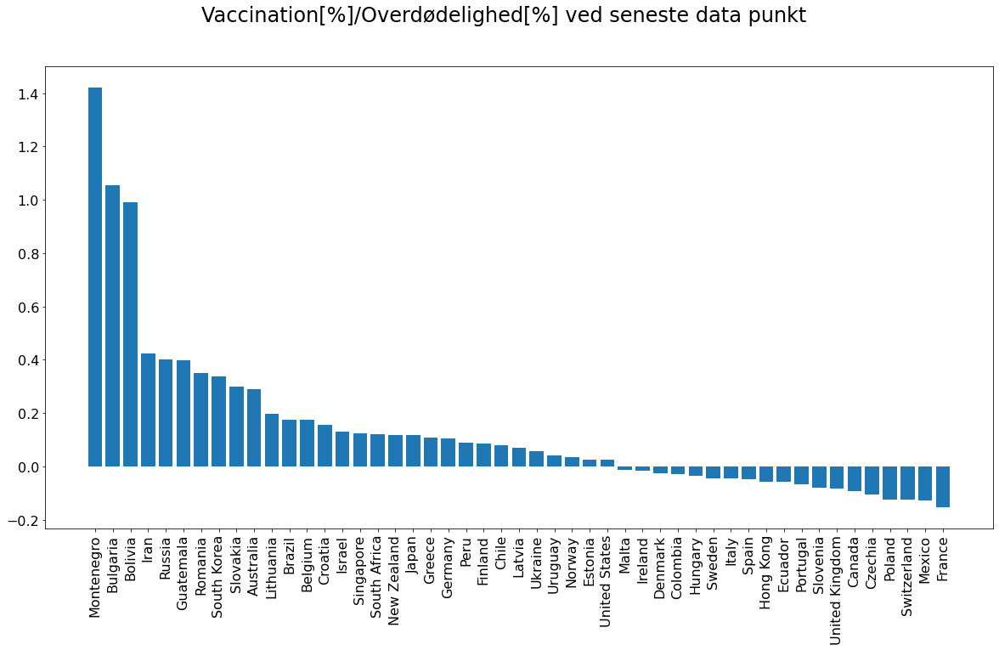

In [23]:
df_r = pd.DataFrame(list(zip(r_loc, vac_mort_ratio)),
               columns =['Location', 'Ratio'])
df_r = df_r.sort_values("Ratio",ascending=False)

fig, (ax1) = plt.subplots(1, figsize=(20,10))
ax1.bar(df_r["Location"],df_r["Ratio"])
ax1.tick_params(axis="x",labelrotation=90)
fig.suptitle("Vaccination[%]/Overdødelighed[%] ved seneste data punkt", fontsize=24)
if saveFigures:
    plt.savefig(path_figs+f"OWiD\interessante_lande.png",bbox_inches = 'tight')

## Finde anormale lande.
Antagelse er at overdødeliged falder lineart med vaccinations mætning. Anomale lande divigerer fra den linje. 

In [24]:
first_axis = "people_fully_vaccinated_per_hundred"
secound_axis = "excess_mortality"

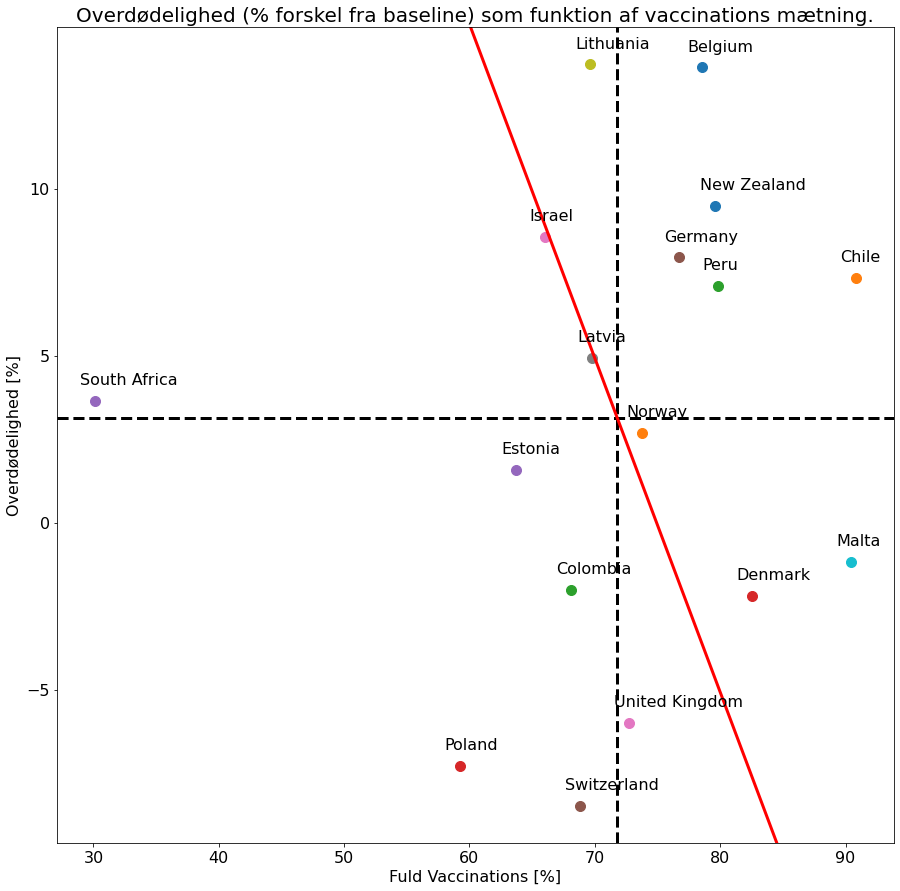

In [25]:
fig, (ax1) = plt.subplots(1, figsize=(15,15))
avg_vac = []
avg_ex = []
for loc in list_of_loc:
    df_loc = choose_location(loc)
    df_loc = df_loc[df_loc["excess_mortality"].notna()]
    df_loc = df_loc[df_loc["people_fully_vaccinated_per_hundred"].notna()]
    if len(df_loc["date"]) > 0:
        if df_loc["date"].iloc[-1] >= pd.to_datetime('2022-04-01'):
            if len(df_loc["date"])>= 10:
                ax1.plot(df_loc["people_fully_vaccinated_per_hundred"].iloc[-1],df_loc["excess_mortality"].iloc[-1],"o")
                ax1.annotate(loc, (df_loc["people_fully_vaccinated_per_hundred"].iloc[-1]-1.2, df_loc["excess_mortality"].iloc[-1]+0.5),
                             fontsize=16)
                avg_vac.append(df_loc["people_fully_vaccinated_per_hundred"].iloc[-1])
                avg_ex.append(df_loc["excess_mortality"].iloc[-1])

ax1.axvline(x=np.mean(avg_vac), color='k', linestyle='--')
ax1.axhline(y=np.mean(avg_ex), color='k', linestyle='--')
ax1.axline((np.mean(avg_vac), np.mean(avg_ex)), slope=-1, color="red")
ax1.set_xlabel('Fuld Vaccinations [%]')
ax1.set_ylabel('Overdødelighed [%]')
ax1.set_title('Overdødelighed (% forskel fra baseline) som funktion af vaccinations mætning.')
if saveFigures:
    plt.savefig(path_figs+f"OWiD\excess_as_full_vac.png",bbox_inches = 'tight')

## Defination af anormalitet $(\nu)$
$$\nu\left(P_{r}\right)=\begin{cases}
\left\Vert P_{r}\right\Vert  & P_{r_{y}}<0\\
-\left\Vert P_{r}\right\Vert & P_{r_{y}}>0\\
0 & P_{r_{y}}=0
\end{cases}$$

$$P_{r}=R\left(\frac{\pi}{4}\right)\cdot P$$

$$P=p-\left(\begin{array}{c}
\bar{x}\\
\bar{y}
\end{array}\right)$$

$p$ er punktet i rummet vi vil find $\nu$ af. $\bar{x}$ og $\bar{y}$ er de gennemsnitlige værdier for alle punkterne i rummet. $R$ er et rotations matrix.
$\theta$ er vinklen $P$ har med planet

### Find tidsserie for alle lande

In [26]:
def rotate(p, angle=math.pi/4):
    R = np.array([[np.cos(angle), -np.sin(angle)],
                      [np.sin(angle),  np.cos(angle)]])
    return R@p

In [27]:
# List of averages:
avg_vac = []
avg_ex = []
for loc in list_of_loc:
    df_loc = choose_location(loc)
    df_loc = df_loc[df_loc["excess_mortality"].notna()]
    df_loc = df_loc[df_loc["people_fully_vaccinated_per_hundred"].notna()]
    if len(df_loc["date"]) > 0:
        if df_loc["date"].iloc[-1] >= pd.to_datetime('2022-03-01'):
            avg_vac.append(df_loc["people_fully_vaccinated_per_hundred"].iloc[-1])
            avg_ex.append(df_loc["excess_mortality"].iloc[-1])

In [28]:
### Old average function, only took given dates average.
# #Write funk taking date. outputs average vac and ex for that date.
# def avg_vacex(date, df=df):
#     df_curdate = df.loc[df['date'] == date]
#     #Remove nan
#     df_curdate = df_curdate[df_curdate["excess_mortality"].notna()]
#     df_curdate = df_curdate[df_curdate["people_fully_vaccinated_per_hundred"].notna()]
#     avg_vac = np.mean(df_curdate["excess_mortality"])
#     avg_ex = np.mean(df_curdate["people_fully_vaccinated_per_hundred"])
#     return avg_vac, avg_ex

In [29]:
# #Write funk taking date. outputs average vac and ex for that date.
def avg_vacex(date, timespan=20, df=df):
    """Takes a datetime and returns average excess mortality and fully vaccinated people,
    of the week surroundings that date"""
    avg_vac_L = []
    avg_ex_L = []
#     df_ex = df[df["excess_mortality"].notna()]
#     df_vac = df[df["people_fully_vaccinated_per_hundred"].notna()]
    for i in range(timespan):
        cur_date = date + datetime.timedelta(days=i-math.ceil(timespan/2))
        df_curdate = df.loc[df['date'] == cur_date]
        
        avg_vac = df_curdate[df_curdate["people_fully_vaccinated_per_hundred"].notna()]["people_fully_vaccinated_per_hundred"].mean()
        avg_ex = df_curdate[df_curdate["excess_mortality"].notna()]["excess_mortality"].mean()
        
        if np.isnan(avg_vac)==False:
            avg_vac_L.append(avg_vac)
        if np.isnan(avg_ex)==False:
            avg_ex_L.append(avg_ex)

    avg_vac = np.mean(avg_vac_L)
    avg_ex = np.mean(avg_ex_L)
    return avg_vac, avg_ex

In [30]:
df_loc = choose_location("Denmark")
date = df_loc["date"].iloc[-60]
date
print(avg_vacex(date,timespan=7))
print(avg_vacex(date,timespan=14))
print(avg_vacex(date,timespan=21))
print(avg_vacex(date,timespan=28))

(60.19539499965752, 8.055833333333334)
(59.88418750715491, 12.119273132017035)
(59.71370784894058, 10.983048599012777)
(59.529341585267275, 11.247951074332175)


In [31]:
# def anomaly_mag(point):
#     if point[1]<0:
#         an_m = abs(math.cos(math.atan(point[0]/point[1]))*(point[0]**2+point[1]**2)**(0.5))
#         return an_m
#     if point[1]>0:
#         an_m = -abs(math.cos(math.atan(point[0]/point[1]))*(point[0]**2+point[1]**2)**(0.5))
#         return an_m
#     if point[1]==0:
#         return 0

In [32]:
def anomaly_mag(point):
    return -point[1]

In [33]:
anomal_dic = {}

for loc in list_of_loc:
    df_loc = choose_location(loc)
    df_loc = df_loc[df_loc["excess_mortality"].notna()]
    df_loc = df_loc[df_loc["people_fully_vaccinated_per_hundred"].notna()]
    
    rel_vac = []
    rel_ex = []
    anomal_list = []
    current_date = []
    avg_vac_list = []
    avg_ex_list = []
    
    
    if len(df_loc)>=10:

        for date in df_loc["date"]:
            cur_date = df_loc.loc[df['date'] == date]
            cur_ex = cur_date["excess_mortality"]
            cur_vac = cur_date["people_fully_vaccinated_per_hundred"]

            if len(df_loc["date"]) > 5:
                avg_vac, avg_ex = avg_vacex(date)

                p = np.array([float(cur_vac),float(cur_ex)])-np.array([avg_vac,avg_ex])
                P = rotate(p)
                
                rel_vac.append(p[0])
                rel_ex.append(p[1])
                avg_vac_list.append(avg_vac)
                avg_ex_list.append(avg_ex)
                

                an_m = anomaly_mag(P)
                anomal_list.append(an_m)
                current_date.append(date)
        anomal_dic[loc] = pd.DataFrame({
                            "date":current_date,
                           "anomal":anomal_list,
                           "relative vaccination":rel_vac,
                          "relative excess":rel_ex,
                          "average vaccination": avg_vac_list,
                          "average excess": avg_ex_list
                                       })

### Lav boxplot for alle lande for at finde de mest anormale

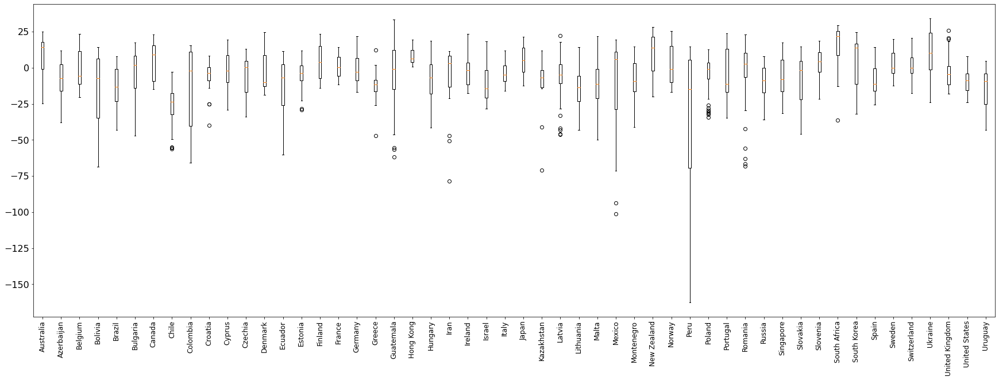

In [34]:
fig, ax1 = plt.subplots(figsize=(30, 10))
k = 0 
for loc in anomal_dic.keys():
    ax1.boxplot(anomal_dic[loc]["anomal"], positions = [k])
    k=k+1
ax1.set_xticklabels(anomal_dic.keys(), fontsize=12)
ax1.tick_params(axis="x",labelrotation=90)

if saveFigures:
        plt.savefig(path_figs+"OWiD/anomal_boxplot.png", bbox_inches = 'tight')

C:\Users\CHRIST~1\AppData\Local\Temp/ipykernel_16944/1709508485.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax2 = plt.subplots(figsize=(30, 10))


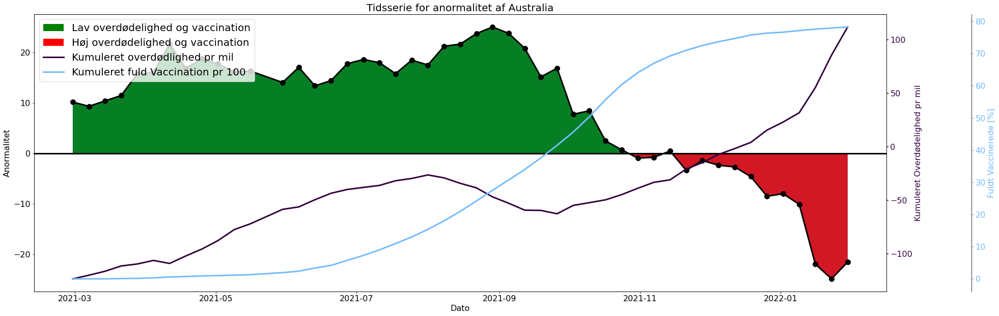

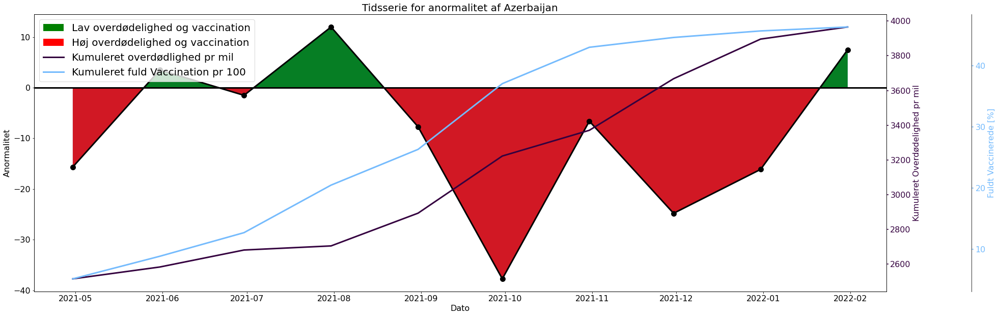

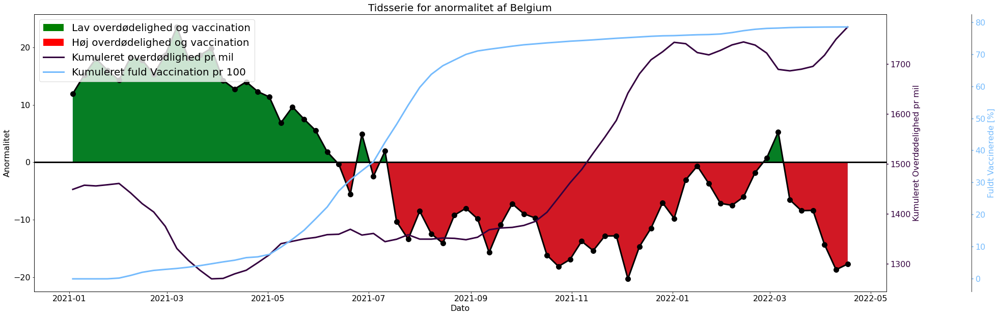

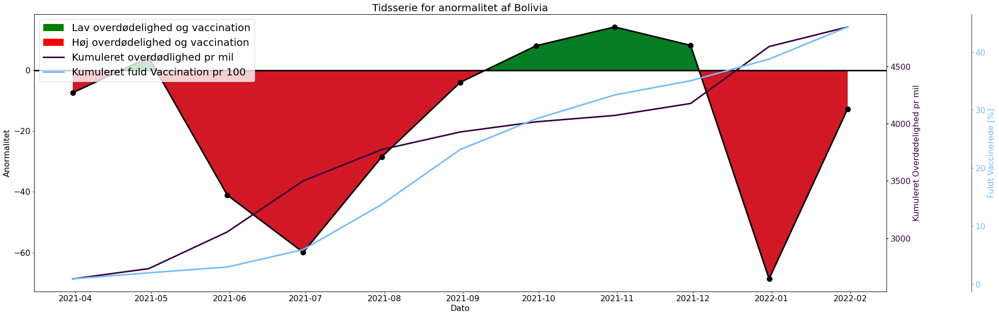

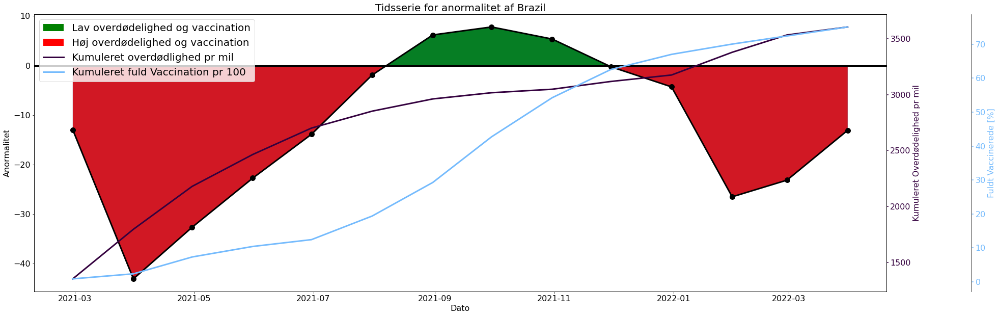

...

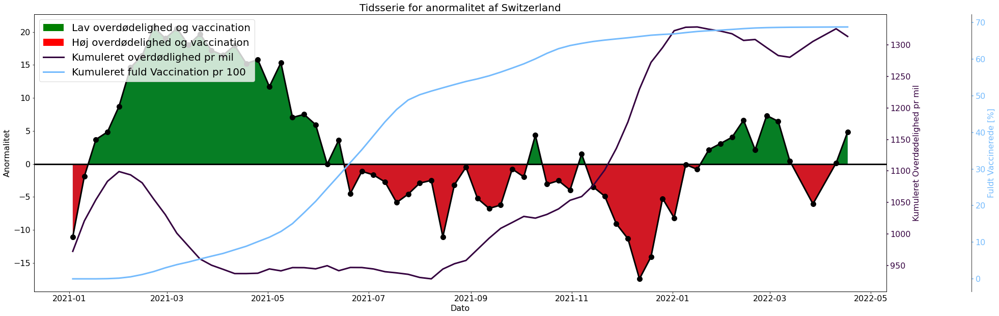

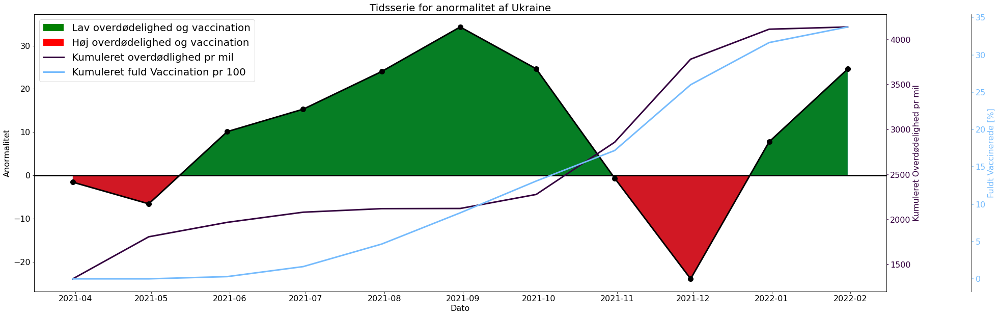

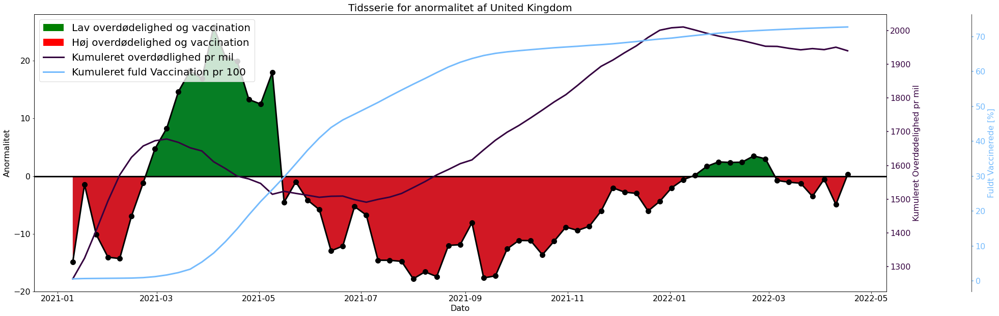

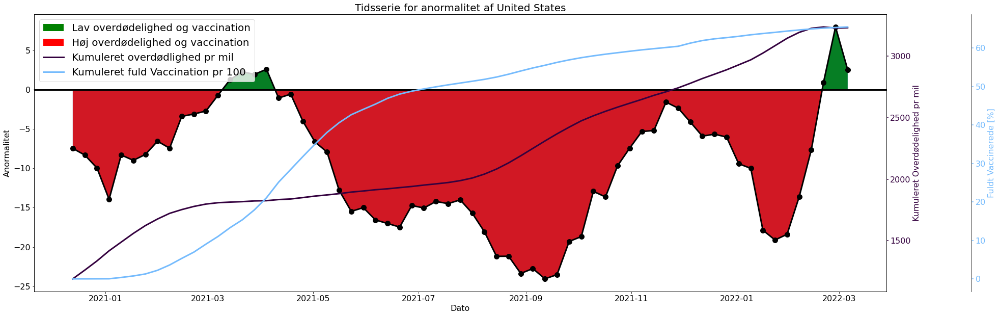

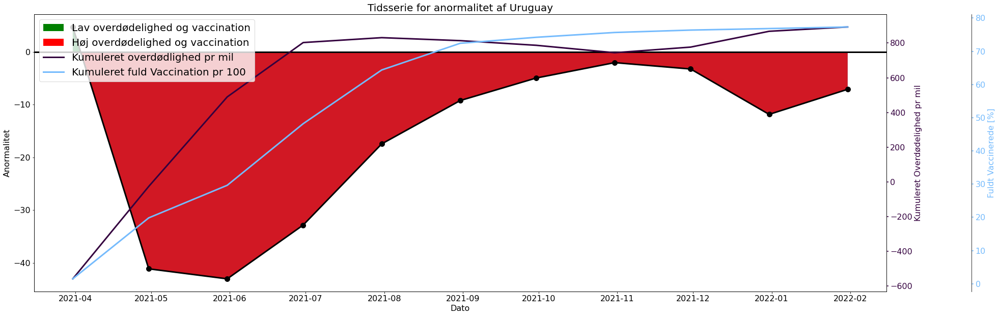

In [35]:
saveFigures = True 
for loc in anomal_dic.keys():
    fig, ax2 = plt.subplots(figsize=(30, 10))
    c3 = 'xkcd:dark violet'
    c4 = 'xkcd:sky blue'
    ax2.plot(anomal_dic[loc]["date"],anomal_dic[loc]["anomal"],color="black", marker='o', linestyle='-',)
    ax2.axhline(y=0, color='k', linestyle='-')
    ax2.fill_between(anomal_dic[loc]["date"], anomal_dic[loc]["anomal"])


    ax2.fill_between(anomal_dic[loc]["date"], anomal_dic[loc]["anomal"], where = anomal_dic[loc]["anomal"] > np.zeros(len(anomal_dic[loc]["anomal"])), 
                    facecolor ='green', alpha = 0.8,interpolate=True)

    ax2.fill_between(anomal_dic[loc]["date"], anomal_dic[loc]["anomal"], where = anomal_dic[loc]["anomal"] < np.zeros(len(anomal_dic[loc]["anomal"])), 
                    facecolor ='red', alpha = 0.8,interpolate=True)

    legend_elements = [ Patch(facecolor='g', label='Lav overdødelighed og vaccination'),
                       Patch(facecolor='r', label='Høj overdødelighed og vaccination'),
                       Line2D([0], [0],color=c3, linestyle="-",label='Kumuleret overdødlighed pr mil'),
                       Line2D([0],[0], color=c4, linestyle="-", label='Kumuleret fuld Vaccination pr 100')
    ]

    ax2.set_xlabel('Dato')
    ax2.set_ylabel('Anormalitet')
    ax2.set_title(f'Tidsserie for anormalitet af {loc}')

    ax3 = ax2.twinx()

    df_loc_2 = choose_location(loc)
    df_loc_2 = df_loc_2[df_loc_2["excess_mortality_cumulative_per_million"].notna()]
    df_loc_2 = df_loc_2[df_loc_2["people_fully_vaccinated_per_hundred"].notna()]



    ax3.plot(df_loc_2["date"],df_loc_2["excess_mortality_cumulative_per_million"], color=c3, linestyle="-")

    ax4 = ax2.twinx()
    ax4.spines.right.set_position(("axes", 1.1))

    ax4.plot(df_loc_2["date"],df_loc_2["people_fully_vaccinated_per_hundred"], color=c4, linestyle="-")

    ax3.set_ylabel("Kumuleret Overdødelighed pr mil")
    ax4.set_ylabel("Fuldt Vaccinerede [%]")
    ax4.plot()

    #ax2.yaxis.label.set_color(p1.get_color())
    ax3.yaxis.label.set_color(c3)
    ax4.yaxis.label.set_color('xkcd:sky blue')


    tkw = dict(size=4, width=1.5)
    #ax.tick_params(axis='y', colors='xkcd:dark violet', **tkw)
    ax3.tick_params(axis='y', colors=c3, **tkw)
    ax4.tick_params(axis='y', colors=c4, **tkw)


    ax4.legend(handles=legend_elements, loc="best", fontsize=20)
    if saveFigures:
        plt.savefig(path_figs+f"OWiD\Anormalitet_tidsserier\{loc}.png",bbox_inches = 'tight')

## Make animation of path traveled

C:\Users\CHRIST~1\AppData\Local\Temp/ipykernel_16944/1306347872.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax1 = plt.subplots()


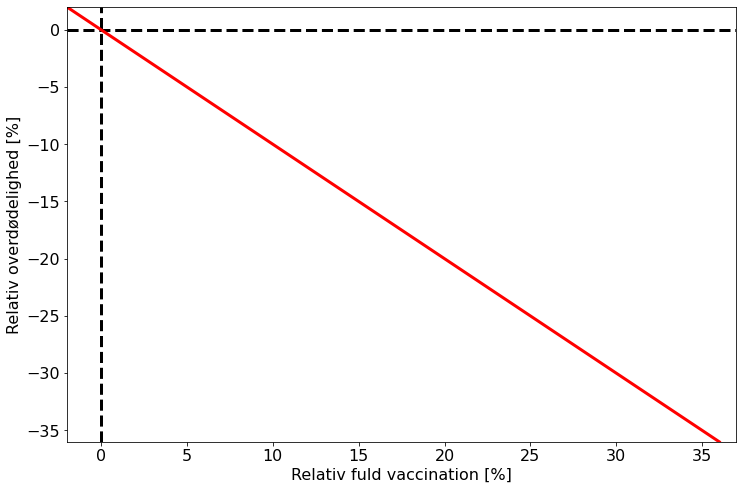

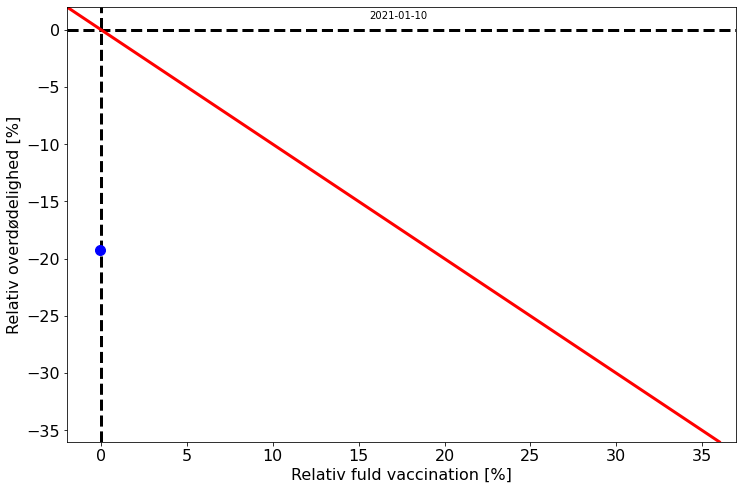

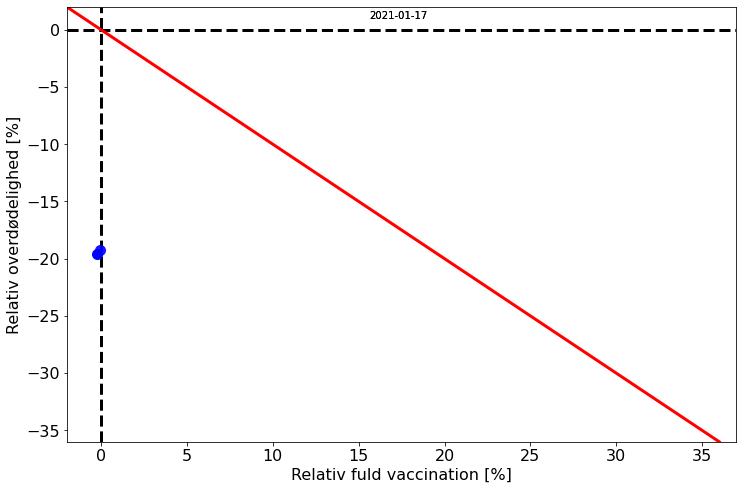

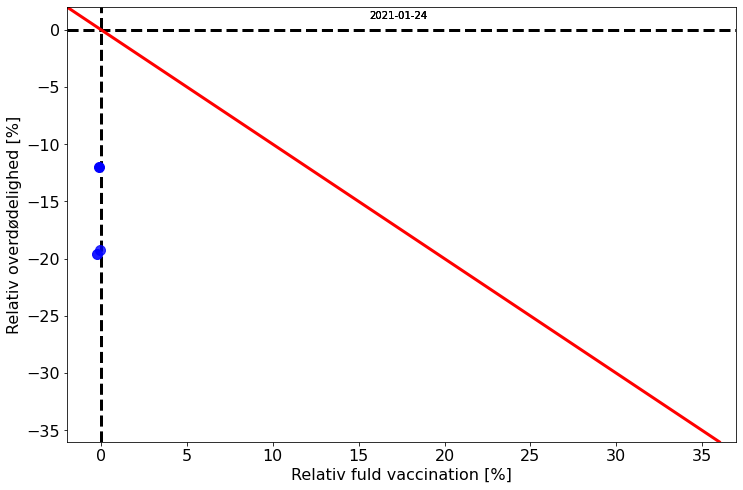

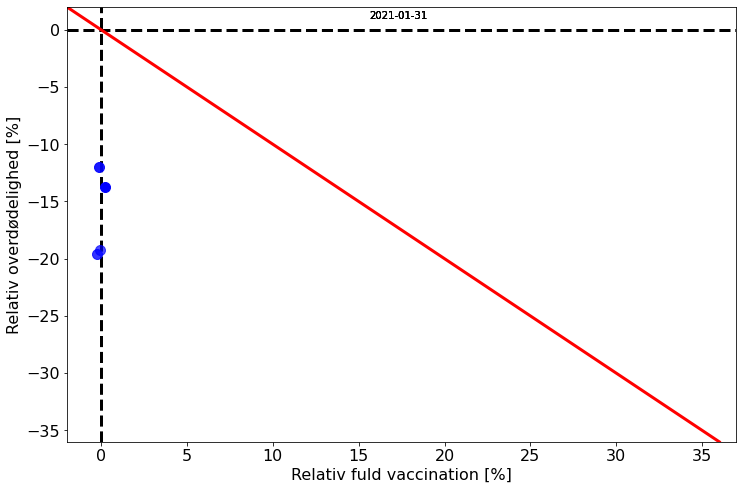

...

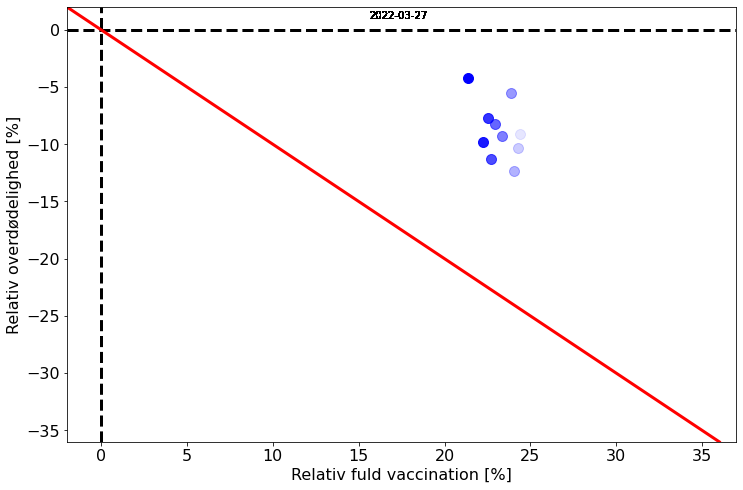

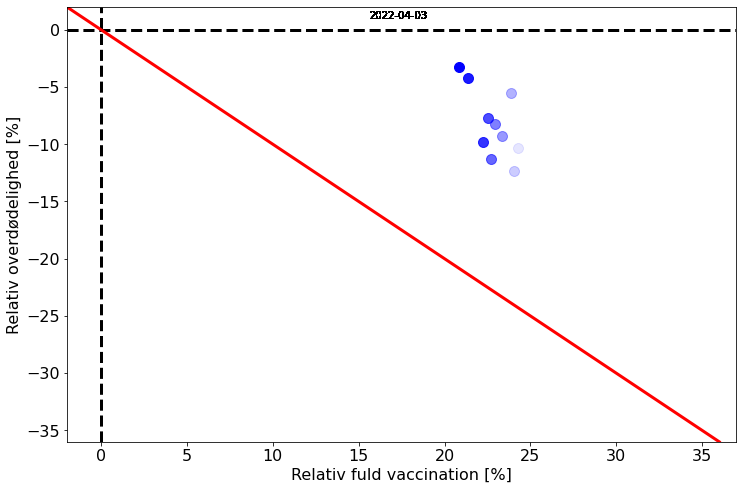

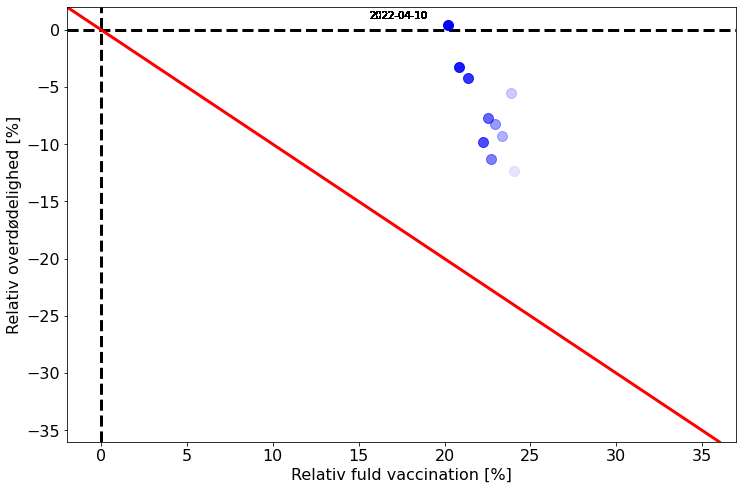

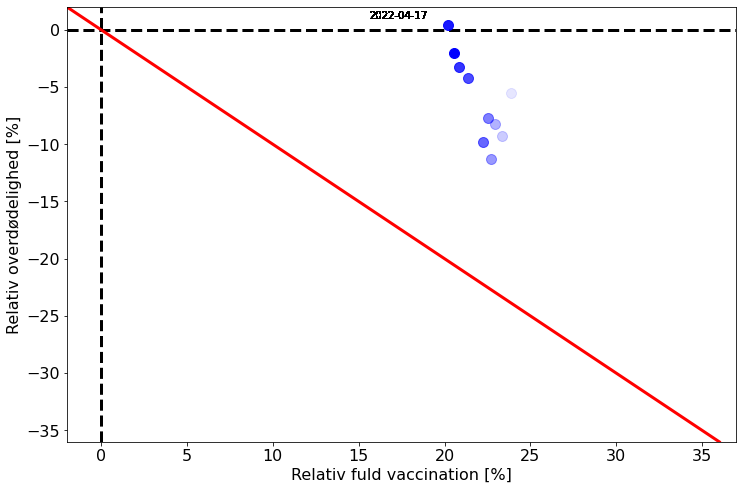

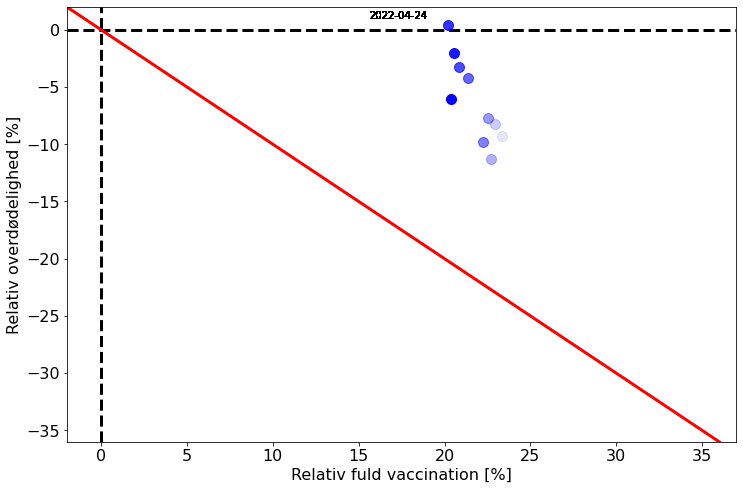

In [36]:
#Makes frames for gif.
loc = "Denmark"
x = anomal_dic[loc]["relative vaccination"]
y = anomal_dic[loc]["relative excess"]

gifdir = f"\OWiD\Time_gifs\{loc}"
trail_length = 10
x_min, x_max = math.floor(min(x))-1, math.ceil(max(x))+1
y_min, y_max = math.floor(min(y))-1, math.ceil(max(y))+1
for k in range(len(x)):
    fig, ax1 = plt.subplots()
    ax1.set_xlim([x_min, x_max])
    ax1.set_ylim([y_min, y_max])
    ax1.axvline(x=0, color='k', linestyle='--')
    ax1.axhline(y=0, color='k', linestyle='--')
    ax1.axline((0, 0), slope=-1, color="red")
    ax1.set_xlabel("Relativ fuld vaccination [%]")
    ax1.set_ylabel("Relativ overdødelighed [%]")
    for i in range(k):
#         ax1.plot(x[k-i],y[k-i],'bo', alpha=math.exp(-i/trail_length))
        if i<=trail_length:
            ax1.plot(x[k-i],y[k-i],'bo', alpha=1-i/trail_length)
        ax1.text((x_max-x_min)/2.5,y_max*0.5,anomal_dic[loc]["date"][k].date())
    plt.savefig(path_figs+gifdir+f"\{k}.png",bbox_inches = 'tight')

In [37]:
### Creates gif of above created png's
from PIL import Image
import glob
import os

os.chdir(path_figs+gifdir)

# Create the frames
frames = []
imgs = sorted(glob.glob('*.png'), key=os.path.getmtime)
for i in imgs:
    new_frame = Image.open(i)
    frames.append(new_frame)
    
#Save into a GIF file that loops forever
frames[0].save('png_to_gif.gif', format='GIF',
               append_images=frames[0:],
               save_all=True,
               duration=300, loop=0)

os.chdir("../../../../notebooks")